# Income Prediction for Addressing Global Income Inequality

## Business Understanding

### Introduction
Income inequality is a pressing issue in developing nations worldwide, exacerbated by the advent of AI and automation. This project aims to leverage machine learning to predict whether an individual's income surpasses or falls below a specific threshold. The goal is to develop a model that not only reduces the cost but also enhances the accuracy of monitoring key population indicators, providing valuable insights for policymakers to mitigate and prevent global income inequality.

### Problem Statement
The growing disparity in income distribution poses a significant challenge, especially in developing nations. Traditional methods of monitoring income levels between census years are costly and may lack accuracy. This project addresses this issue by employing machine learning to predict income levels, offering a more efficient and precise alternative for policymakers.

### Objectives
To create a machine learning model for predicting an individual's income level, thereby aiding policymakers in managing and preventing income inequality globally.

## Analytical Questions:

### Univariate Questions:
* What is the distribution of age in the dataset?

* How is gender distributed among individuals in the dataset?

* What is the most common education level among the individuals?

### Bivariate Question:

* How does education correlate with employment commitment?

### Multivariate Question:
* How does the combination of education, age, and occupation relate to income levels?

* How does marital status influence the relationship between age and income?

### Hypothesis:
Younger individuals with higher education levels are more likely to earn above the income threshold.


Hypothesis 2: Gender-based income disparities exist, with males generally earning more than females.
Hypothesis 3: There is a positive correlation between education level and employment commitment.
Hypothesis 4: Certain industries and occupations are associated with higher income levels.
Hypothesis 5: Marital status, in combination with age, influences an individual's income, with married individuals potentially earning more.






In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from termcolor import colored
import plotly.express as px
import os

from scipy.stats import chi2_contingency

from sklearn.model_selection import train_test_split
#from catboost import CatBoostClassifier
from sklearn.metrics import f1_score,accuracy_score,classification_report
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,FunctionTransformer,LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

#import the necessary Classifiers
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

import joblib

import warnings
warnings.filterwarnings('always') 

In [2]:


# Get the current working directory
current_directory = os.getcwd()
print("Current Working Directory:", current_directory)

# Navigate to the parent directory
parent_directory = os.path.dirname(current_directory)
os.chdir(parent_directory)
print("Changed to Parent Directory:", os.getcwd())

# Reading train and test datasets
train_data = pd.read_csv('Train.csv')
test_data = pd.read_csv('Test.csv')
variable_def = pd.read_csv('VariableDefinitions.csv')
samplesub = pd.read_csv('SampleSubmission.csv')


Current Working Directory: /Users/mkboyoo/Desktop/capstoneproject/Capstoneproject/dev
Changed to Parent Directory: /Users/mkboyoo/Desktop/capstoneproject/Capstoneproject


In [3]:
variable_def

,Column,Description
0,age,Age Of Individual
1,gender,Gender
2,education,Education
3,class,Class Of Worker
4,education_institute,Enrolled Educational Institution in last week
5,marital_status,Marital_Status
6,race,Race
7,is_hispanic,Hispanic Origin
8,employment_commitment,Full Or Part Time Employment Stat
9,unemployment_reason,Reason For Unemployment


In [4]:
train_data.head()

,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record,income_above_limit
0,ID_TZ0000,79,Female,High school graduate,NaN,NaN,Widowed,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1779.74,Below limit
1,ID_TZ0001,65,Female,High school graduate,NaN,NaN,Widowed,White,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,2366.75,Below limit
2,ID_TZ0002,21,Male,12th grade no diploma,Federal government,NaN,Never married,Black,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1693.42,Below limit
3,ID_TZ0003,2,Female,Children,NaN,NaN,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,...,India,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1380.27,Below limit
4,ID_TZ0004,70,Male,High school graduate,NaN,NaN,Married-civilian spouse present,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1580.79,Below limit


In [5]:
test_data.head()

,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_father,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record
0,ID_TZ209499,54,Male,High school graduate,Private,NaN,Married-civilian spouse present,White,All other,Children or Armed Forces,...,US,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,3388.96
1,ID_TZ209500,53,Male,5th or 6th grade,Private,NaN,Married-civilian spouse present,White,Central or South American,Full-time schedules,...,El-Salvador,El-Salvador,?,?,?,?,NaN,NaN,NaN,1177.55
2,ID_TZ209501,42,Male,Bachelors degree(BA AB BS),Private,NaN,Married-civilian spouse present,White,All other,Full-time schedules,...,US,US,?,?,?,?,NaN,NaN,NaN,4898.55
3,ID_TZ209502,16,Female,9th grade,NaN,High school,Never married,White,All other,Children or Armed Forces,...,US,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1391.44
4,ID_TZ209503,16,Male,9th grade,NaN,High school,Never married,White,All other,Not in labor force,...,US,US,?,?,?,?,NaN,NaN,NaN,1933.18


# We will explore the train dataset then do same after for the test dataset

In [6]:
train_data.shape

(209499, 43)

In [7]:
# gettinf the general summary information for the dataset
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 43 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              209499 non-null  object 
 1   age                             209499 non-null  int64  
 2   gender                          209499 non-null  object 
 3   education                       209499 non-null  object 
 4   class                           104254 non-null  object 
 5   education_institute             13302 non-null   object 
 6   marital_status                  209499 non-null  object 
 7   race                            209499 non-null  object 
 8   is_hispanic                     209499 non-null  object 
 9   employment_commitment           209499 non-null  object 
 10  unemployment_reason             6520 non-null    object 
 11  employment_stat                 209499 non-null  int64  
 12  wage_per_hour   

In [8]:
#checking for duplicates
train_data.duplicated().sum()

0

In [9]:
# Include all types in the description
train_data.describe(include='all')


,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record,income_above_limit
count,209499,209499.000000,209499,209499,104254,13302,209499,209499,209499,209499,...,209499,207911,121047,207911,207911,103215,16351,16351,209499.000000,209499
unique,209499,NaN,2,17,8,2,7,5,10,8,...,43,9,3,9,8,2,5,50,NaN,2
top,ID_TZ0000,NaN,Female,High school graduate,Private,High school,Never married,White,All other,Children or Armed Forces,...,US,?,?,?,?,Same,South,California,NaN,Below limit
freq,1,NaN,108784,50627,75617,7247,90723,175709,180404,129789,...,168233,104696,104696,104696,104696,86864,5056,1849,NaN,196501
mean,NaN,34.518728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1740.888324,NaN
std,NaN,22.306738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,995.559557,NaN
min,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.870000,NaN
25%,NaN,15.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1061.290000,NaN
50%,NaN,33.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1617.040000,NaN
75%,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2185.480000,NaN


In [10]:
# we check for only numerical columns
train_data.describe()

,age,employment_stat,wage_per_hour,working_week_per_year,industry_code,occupation_code,total_employed,vet_benefit,gains,losses,stocks_status,mig_year,importance_of_record
count,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000,209499.000000
mean,34.518728,0.176760,55.433487,23.158850,15.332398,11.321734,1.956067,1.515854,435.926887,36.881737,194.533420,94.499745,1740.888324
std,22.306738,0.555562,276.757327,24.397963,18.049655,14.460839,2.365154,0.850853,4696.359500,270.383302,1956.375501,0.500001,995.559557
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000,37.870000
25%,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,94.000000,1061.290000
50%,33.000000,0.000000,0.000000,8.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,94.000000,1617.040000
75%,50.000000,0.000000,0.000000,52.000000,33.000000,26.000000,4.000000,2.000000,0.000000,0.000000,0.000000,95.000000,2185.480000
max,90.000000,2.000000,9999.000000,52.000000,51.000000,46.000000,6.000000,2.000000,99999.000000,4608.000000,99999.000000,95.000000,18656.300000


In [11]:

#checking for null values

train_data.isna().sum()

ID                                     0
age                                    0
gender                                 0
education                              0
class                             105245
education_institute               196197
marital_status                         0
race                                   0
is_hispanic                            0
employment_commitment                  0
unemployment_reason               202979
employment_stat                        0
wage_per_hour                          0
is_labor_union                    189420
working_week_per_year                  0
industry_code                          0
industry_code_main                     0
occupation_code                        0
occupation_code_main              105694
total_employed                         0
household_stat                         0
household_summary                      0
under_18_family                   151654
veterans_admin_questionnaire      207415
vet_benefit     

In [12]:
# Checking the percentage of ull values
null_percentage = train_data.isnull().mean() * 100

# Displaying the result
print(null_percentage)

ID                                 0.000000
age                                0.000000
gender                             0.000000
education                          0.000000
class                             50.236517
education_institute               93.650566
marital_status                     0.000000
race                               0.000000
is_hispanic                        0.000000
employment_commitment              0.000000
unemployment_reason               96.887813
employment_stat                    0.000000
wage_per_hour                      0.000000
is_labor_union                    90.415706
working_week_per_year              0.000000
industry_code                      0.000000
industry_code_main                 0.000000
occupation_code                    0.000000
occupation_code_main              50.450837
total_employed                     0.000000
household_stat                     0.000000
household_summary                  0.000000
under_18_family                 

In [13]:
# Sort the null percentages in descending order
sorted_null_percentage = null_percentage.sort_values(ascending=False)

# Display the sorted result
print(sorted_null_percentage)



veterans_admin_questionnaire      99.005246
unemployment_reason               96.887813
education_institute               93.650566
old_residence_state               92.195189
old_residence_reg                 92.195189
is_labor_union                    90.415706
under_18_family                   72.388890
residence_1_year_ago              50.732462
occupation_code_main              50.450837
class                             50.236517
migration_prev_sunbelt            42.220727
migration_code_change_in_msa       0.757999
migration_code_change_in_reg       0.757999
migration_code_move_within_reg     0.757999
losses                             0.000000
stocks_status                      0.000000
citizenship                        0.000000
ID                                 0.000000
mig_year                           0.000000
country_of_birth_own               0.000000
country_of_birth_father            0.000000
country_of_birth_mother            0.000000
tax_status                      

# We perform univariate analysis on some of the  columns

In [14]:
plot_train = train_data.copy()

In [15]:
plot_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 43 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              209499 non-null  object 
 1   age                             209499 non-null  int64  
 2   gender                          209499 non-null  object 
 3   education                       209499 non-null  object 
 4   class                           104254 non-null  object 
 5   education_institute             13302 non-null   object 
 6   marital_status                  209499 non-null  object 
 7   race                            209499 non-null  object 
 8   is_hispanic                     209499 non-null  object 
 9   employment_commitment           209499 non-null  object 
 10  unemployment_reason             6520 non-null    object 
 11  employment_stat                 209499 non-null  int64  
 12  wage_per_hour   

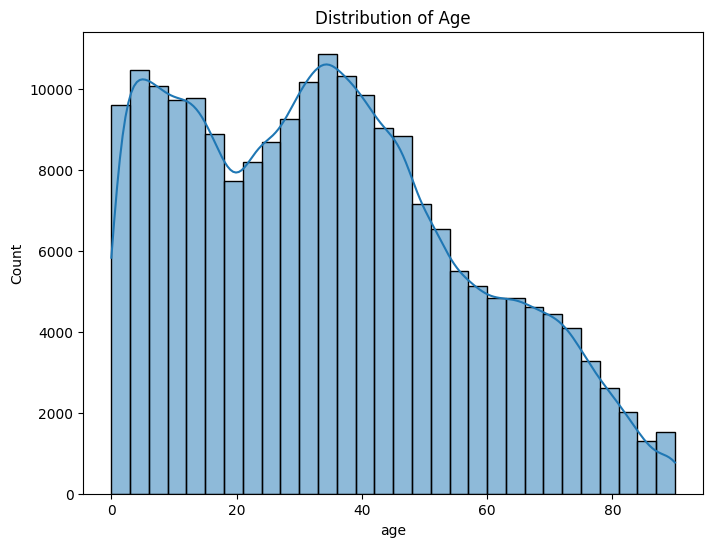

In [16]:


# Plot for 'age' distribution
plt.figure(figsize=(8, 6))
sns.histplot(plot_train['age'], bins=30, kde=True)
plt.title('Distribution of Age')
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/1714503636.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='gender', data=plot_train, palette='Set3')


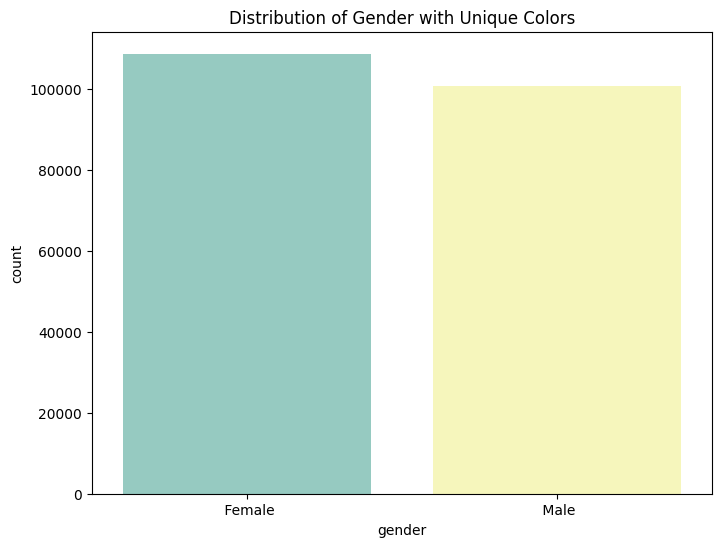

In [17]:


# Plot the distribution of gender
plt.figure(figsize=(8, 6))
sns.countplot(x='gender', data=plot_train, palette='Set3')
plt.title('Distribution of Gender with Unique Colors')
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/632057204.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="education", data=plot_train, palette='Set3', order=plot_train["education"].value_counts().index)


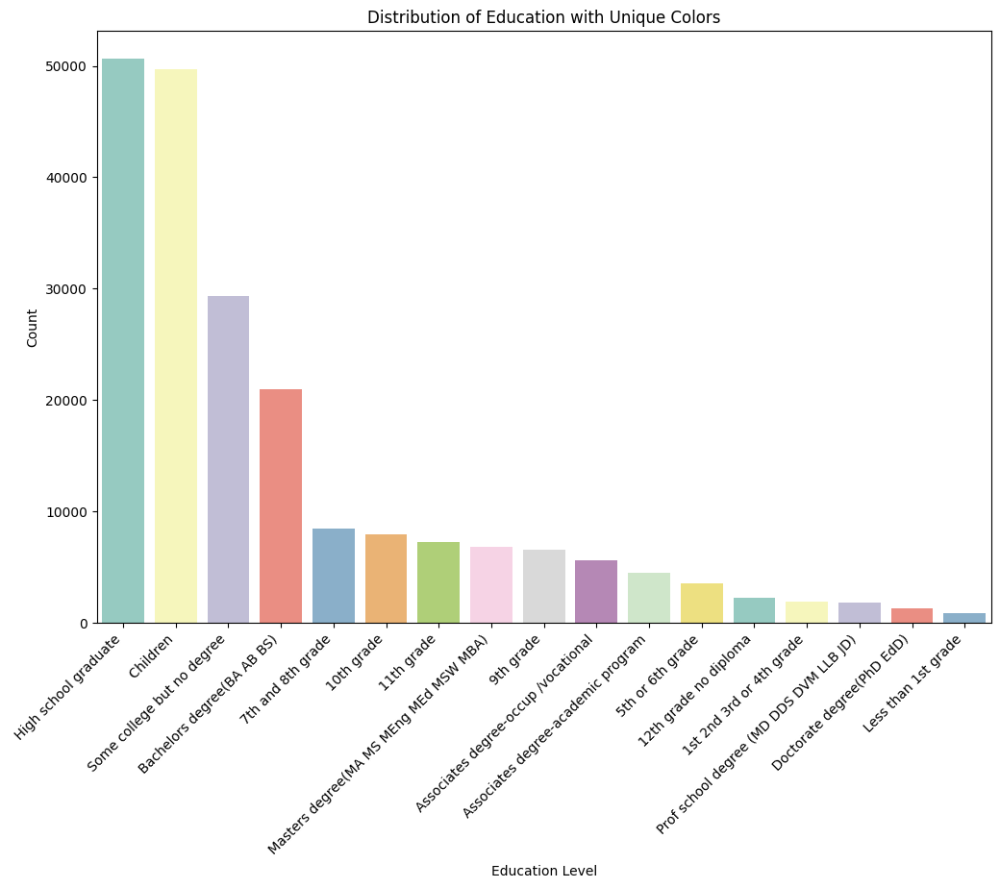

In [18]:


# Plot the distribution of education 
plt.figure(figsize=(12, 8))
sns.countplot(x="education", data=plot_train, palette='Set3', order=plot_train["education"].value_counts().index)
plt.title("Distribution of Education with Unique Colors")
plt.xlabel("Education Level")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/735266394.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="education_institute", data=plot_train, palette='Set3', order=plot_train["education_institute"].value_counts().index)


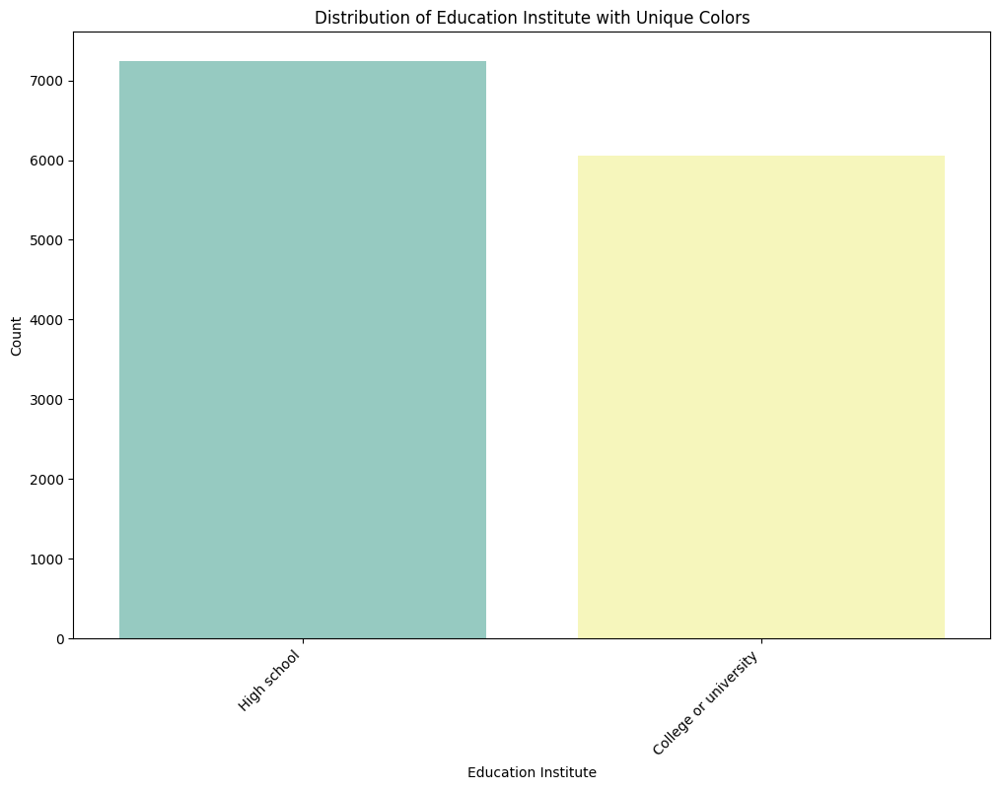

In [19]:


# Plot the distribution of education_institute with unique color for each bar
plt.figure(figsize=(12, 8))
sns.countplot(x="education_institute", data=plot_train, palette='Set3', order=plot_train["education_institute"].value_counts().index)
plt.title("Distribution of Education Institute with Unique Colors")
plt.xlabel("Education Institute")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/3700717991.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="race", data=plot_train, palette='Set3', order=plot_train["race"].value_counts().index)


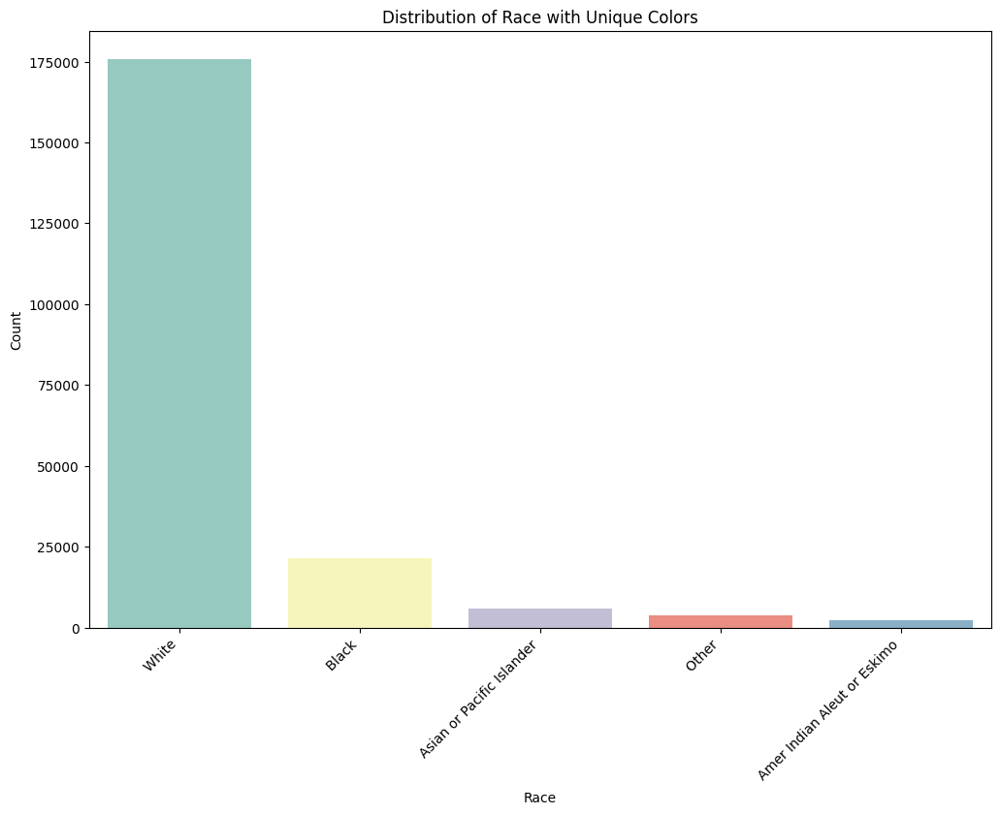

In [20]:


# Plot the distribution of race with unique color for each bar
plt.figure(figsize=(12, 8))
sns.countplot(x="race", data=plot_train, palette='Set3', order=plot_train["race"].value_counts().index)
plt.title("Distribution of Race with Unique Colors")
plt.xlabel("Race")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/3546019685.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="citizenship", data=plot_train, palette='Set3', order=plot_train["citizenship"].value_counts().index)


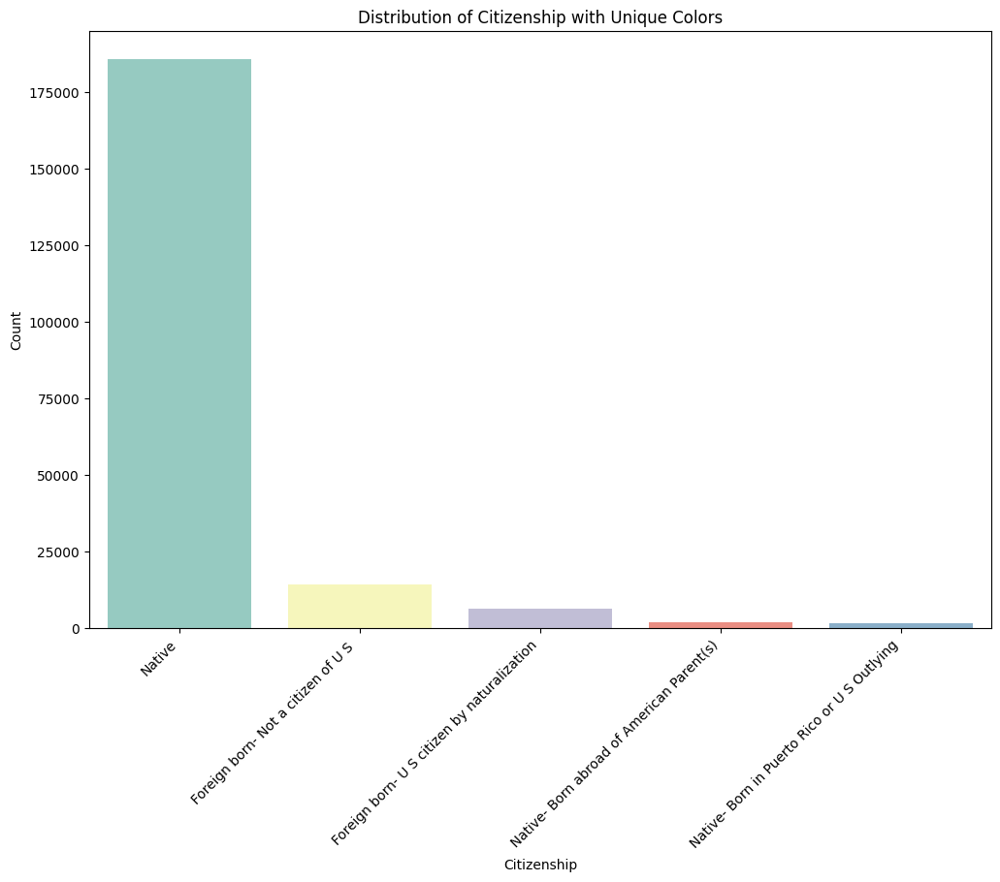

In [21]:


# Plot the distribution of citizenship with unique color for each bar
plt.figure(figsize=(12, 8))
sns.countplot(x="citizenship", data=plot_train, palette='Set3', order=plot_train["citizenship"].value_counts().index)
plt.title("Distribution of Citizenship with Unique Colors")
plt.xlabel("Citizenship")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.show()


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/513018226.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='income_above_limit', data=plot_train, palette='husl')


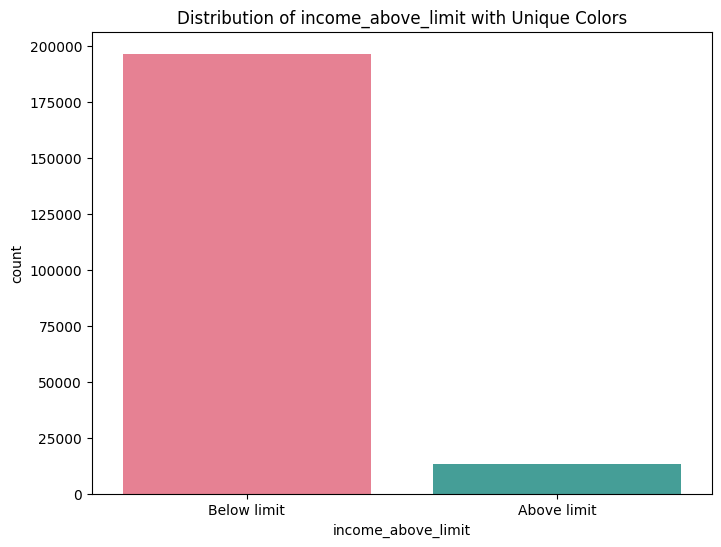

In [22]:


# Plot the distribution of income_above_limit 
plt.figure(figsize=(8, 6))
sns.countplot(x='income_above_limit', data=plot_train, palette='husl')
plt.title('Distribution of income_above_limit with Unique Colors')
plt.show()


We can see from the diagram above that majority of the workers have a lower income compared to the workers abov

/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/34206185.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="occupation_code_main", data=plot_train, palette="Set3", order=plot_train["occupation_code_main"].value_counts().index)


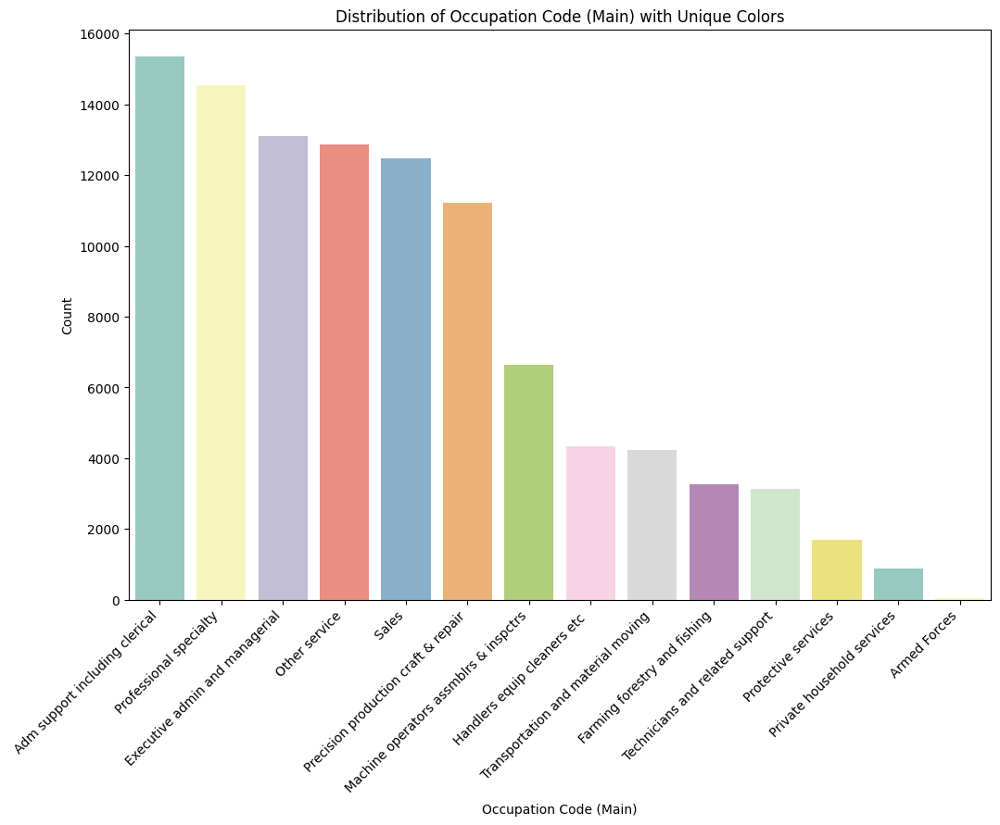

In [23]:


# Plot the distribution of occupation_code_main 
plt.figure(figsize=(12, 8))
sns.countplot(x="occupation_code_main", data=plot_train, palette="Set3", order=plot_train["occupation_code_main"].value_counts().index)
plt.title("Distribution of Occupation Code (Main) with Unique Colors")
plt.xlabel("Occupation Code (Main)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.show()


We can see a lot more workers are into Administrative support whiles few workers are in to armed forces

# Bivariate analysis### Bivariate Question:

* How does education correlate with employment commitment?


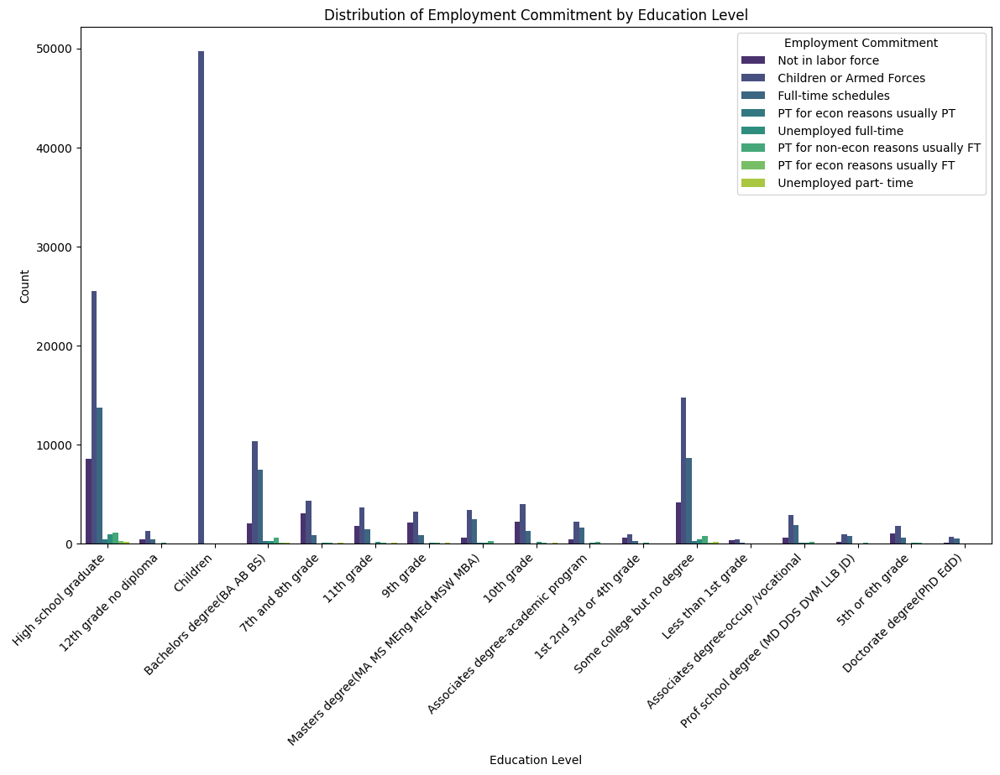

In [24]:
# Create a stacked bar plot
plt.figure(figsize=(14, 8))
sns.countplot(data=plot_train, x='education', hue='employment_commitment', palette='viridis')
plt.title('Distribution of Employment Commitment by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Employment Commitment', loc='upper right')
plt.show()


Another representation of the above in plotly

In [25]:
# Create a grouped DataFrame for counting values
grouped_df = plot_train.groupby(['education', 'employment_commitment']).size().reset_index(name='count')

# Create an interactive stacked bar plot using Plotly Express
fig = px.bar(grouped_df, x='education', y='count', color='employment_commitment',
             title='Distribution of Employment Commitment by Education Level',
             labels={'count': 'Count', 'education': 'Education Level'},
             category_orders={'education': plot_train['education'].value_counts().index},
             width=800, height=500)

# Rotate x-axis labels for better readability
fig.update_layout(xaxis=dict(tickangle=45, tickmode='array'))

# Show the plot
#fig.show(renderer="png")

fig.show()


In [26]:


# Create a contingency table
contingency_table = pd.crosstab(plot_train['education'], plot_train['employment_commitment'])

# Perform chi-square test
chi2, p, _, _ = chi2_contingency(contingency_table)

# Print the results
print(f"Chi-square value: {chi2}")
print(f"P-value: {p}")

# Interpret the results
if p < 0.05:
    print("There is a significant association between education and employment commitment.")
else:
    print("There is no significant association between education and employment commitment.")


Chi-square value: 53128.74065005501
P-value: 0.0
There is a significant association between education and employment commitment.


In [27]:

# we drop all columns with over 70% null valies

# List of columns to be dropped
columns_to_drop = [
    'veterans_admin_questionnaire',
    'unemployment_reason',
    'education_institute',
    'old_residence_state',
    'old_residence_reg',
    'is_labor_union',
    'under_18_family'
]

# Drop the specified columns
plot_train = train_data.drop(columns=columns_to_drop)


### Multivariate Questions:

* How does the combination of education, age, and race relate to income levels?


/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/3266692275.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/3266692275.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



<Figure size 1600x800 with 0 Axes>

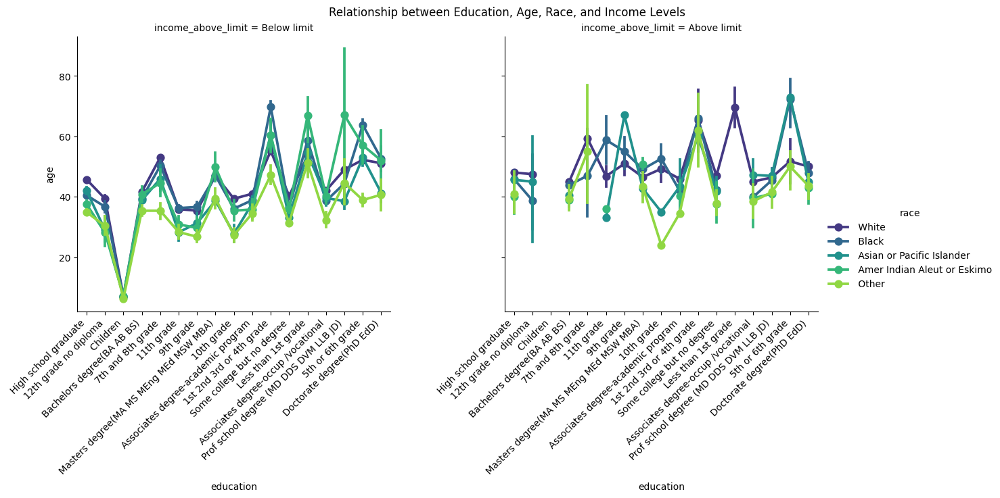

In [28]:
# Create a categorical plot (catplot) with education, age, race, and income levels
plt.figure(figsize=(16, 8))
catplot = sns.catplot(x='education', y='age', hue='race', col='income_above_limit', data=plot_train, kind='point', height=5, aspect=1.2, palette='viridis')

# Rotate x-axis labels for better readability
for ax in catplot.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.suptitle('Relationship between Education, Age, Race, and Income Levels', y=1.02)
plt.show()


In [29]:
# Create a faceted scatter plot with angled x-axis labels
fig = px.scatter(plot_train, x='education', y='age', color='income_above_limit', facet_col='race',
                 category_orders={'race': plot_train['race'].value_counts().index,
                                  'education': plot_train['education'].value_counts().index},
                 labels={'education': 'Education Level', 'age': 'Age', 'race': 'Race'},
                 title='Scatter Plot of Education, Age, Race, and Income Levels',
                 facet_col_wrap=3, height=600, width=1000)

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)

# Show the plot
fig.show()


In [30]:
# Create a contingency table
contingency_table_gender_marital_class = pd.crosstab(plot_train['education'],
                                                     [plot_train['age'],
                                                      plot_train['race'],
                                                      plot_train['income_above_limit']])

# Perform chi-square test
chi2, p, _, _ = chi2_contingency(contingency_table_gender_marital_class)

# Print the results
print(f"Chi-square value: {chi2}")
print(f"P-value: {p}")

# Interpret the results
if p < 0.05:
    print("There is a significant association between education, race, and income levels.")
else:
    print("There is no significant association between education, race, and income levels.")


Chi-square value: 388781.56105935434
P-value: 0.0
There is a significant association between education, race, and income levels.


* How does the combination of gender, marital status, and class relate to income levels?

In [31]:
# Create a faceted scatter plot with angled x-axis labels for gender, marital status, class, and income levels
fig = px.scatter(plot_train, x='gender', y='marital_status', color='income_above_limit', facet_col='class',
                 category_orders={'gender': plot_train['gender'].value_counts().index,
                                  'marital_status': plot_train['marital_status'].value_counts().index,
                                  'class': plot_train['class'].value_counts().index},
                 labels={'gender': 'Gender', 'marital_status': 'Marital Status', 'class': 'Class'},
                 title='Scatter Plot of Gender, Marital Status, Class, and Income Levels',
                 facet_col_wrap=3, height=600, width=1000)

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)

# Show the plot
fig.show()


In [32]:
# Create a contingency table
contingency_table_gender_marital_class = pd.crosstab(plot_train['gender'],
                                                     [plot_train['marital_status'],
                                                      plot_train['class'],
                                                      plot_train['income_above_limit']])

# Perform chi-square test
chi2, p, _, _ = chi2_contingency(contingency_table_gender_marital_class)

# Print the results
print(f"Chi-square value: {chi2}")
print(f"P-value: {p}")

# Interpret the results
if p < 0.05:
    print("There is a significant association between gender, marital status, class, and income levels.")
else:
    print("There is no significant association between gender, marital status, class, and income levels.")


Chi-square value: 7817.251952686911
P-value: 0.0
There is a significant association between gender, marital status, class, and income levels.


## Income Distribution Amoung Various groups for more clearer Visualization 

##### Age 

/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/1932161404.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




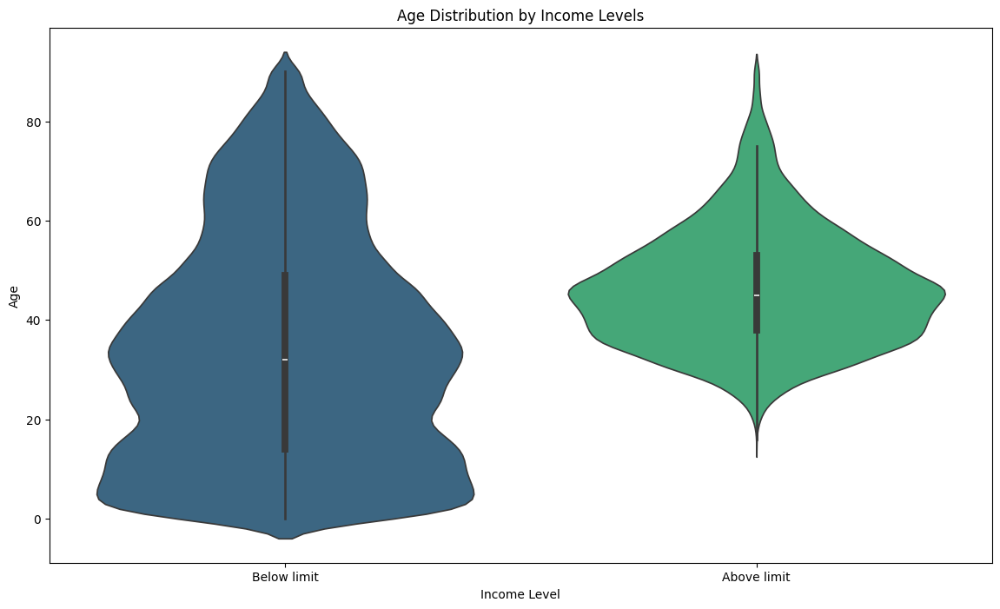

,count,mean,std,min,25%,50%,75%,max
income_above_limit,,,,,,,,
Above limit,12998.0,46.323204,11.759821,16.0,38.0,45.0,53.0,90.0
Below limit,196501.0,33.737894,22.617047,0.0,14.0,32.0,49.0,90.0


In [33]:
# Violin plot for Age and Income Levels
plt.figure(figsize=(14, 8))
sns.violinplot(x='income_above_limit', y='age', data=plot_train, palette='viridis')
plt.title('Age Distribution by Income Levels')
plt.xlabel('Income Level')
plt.ylabel('Age')
plt.show()

# Descriptive statistics for Age by Income Levels
age_stats = train_data.groupby('income_above_limit')['age'].describe()
age_stats

Other Groups

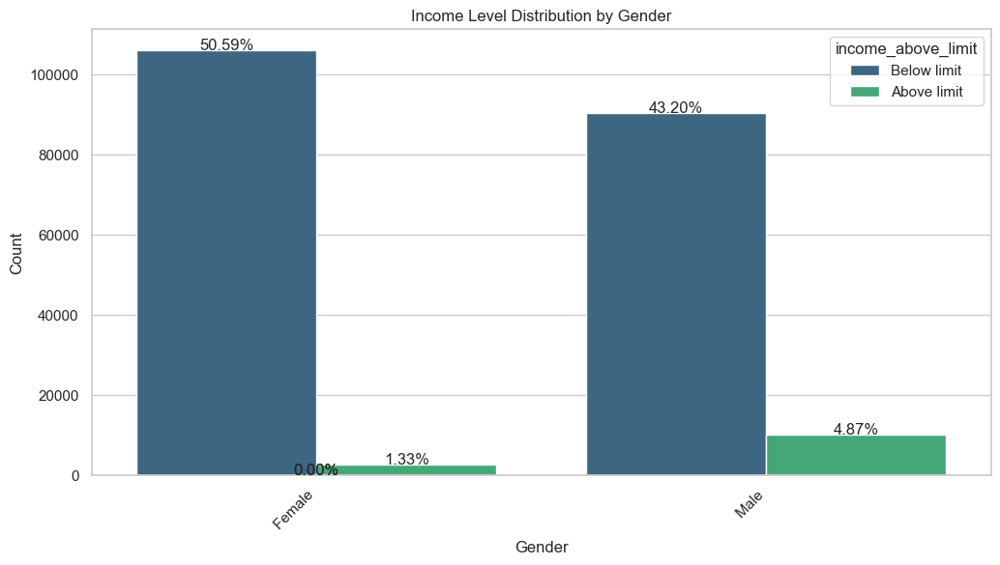

Count Table:
| gender   |   Above limit |   Below limit |   Total |
|:---------|--------------:|--------------:|--------:|
| Female   |          2788 |        105996 |  108784 |
| Male     |         10210 |         90505 |  100715 |
| Total    |         12998 |        196501 |  209499 |

Percentage Table:
| gender   |   Above limit |   Below limit |    Total |
|:---------|--------------:|--------------:|---------:|
| Female   |       21.4495 |       53.9417 |  51.9258 |
| Male     |       78.5505 |       46.0583 |  48.0742 |
| Total    |      100      |      100      | 100      |


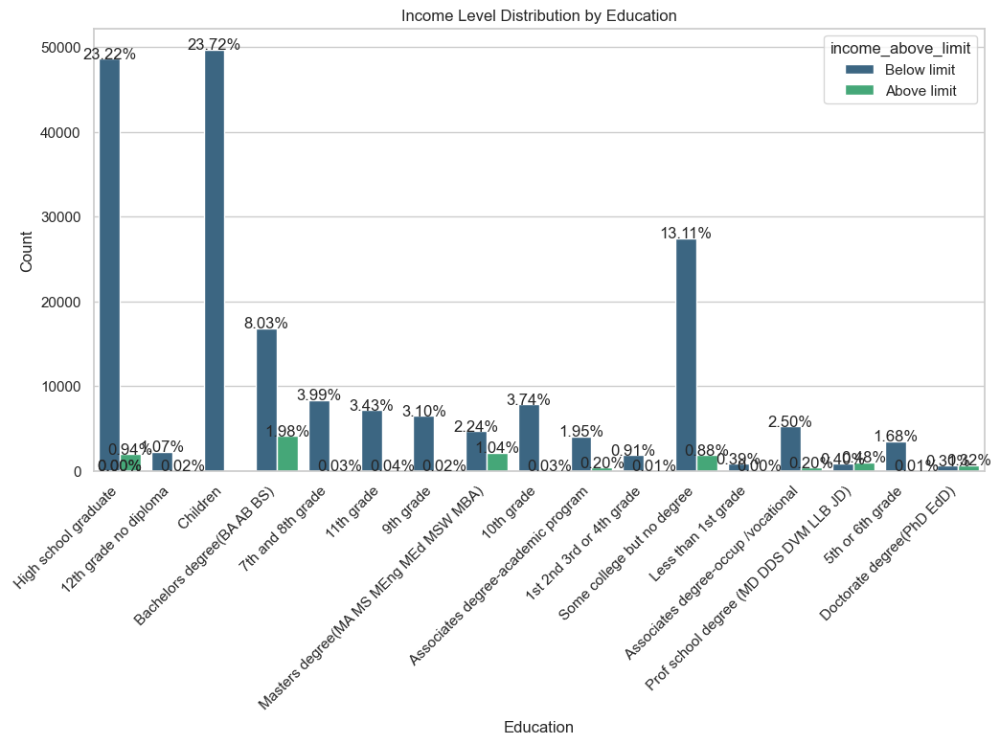

Count Table:
| education                              |   Above limit |   Below limit |   Total |
|:---------------------------------------|--------------:|--------------:|--------:|
| 10th grade                             |            64 |          7841 |    7905 |
| 11th grade                             |            82 |          7178 |    7260 |
| 12th grade no diploma                  |            35 |          2247 |    2282 |
| 1st 2nd 3rd or 4th grade               |            15 |          1902 |    1917 |
| 5th or 6th grade                       |            30 |          3512 |    3542 |
| 7th and 8th grade                      |            72 |          8366 |    8438 |
| 9th grade                              |            44 |          6496 |    6540 |
| Associates degree-academic program     |           413 |          4081 |    4494 |
| Associates degree-occup /vocational    |           409 |          5241 |    5650 |
| Bachelors degree(BA AB BS)             |          

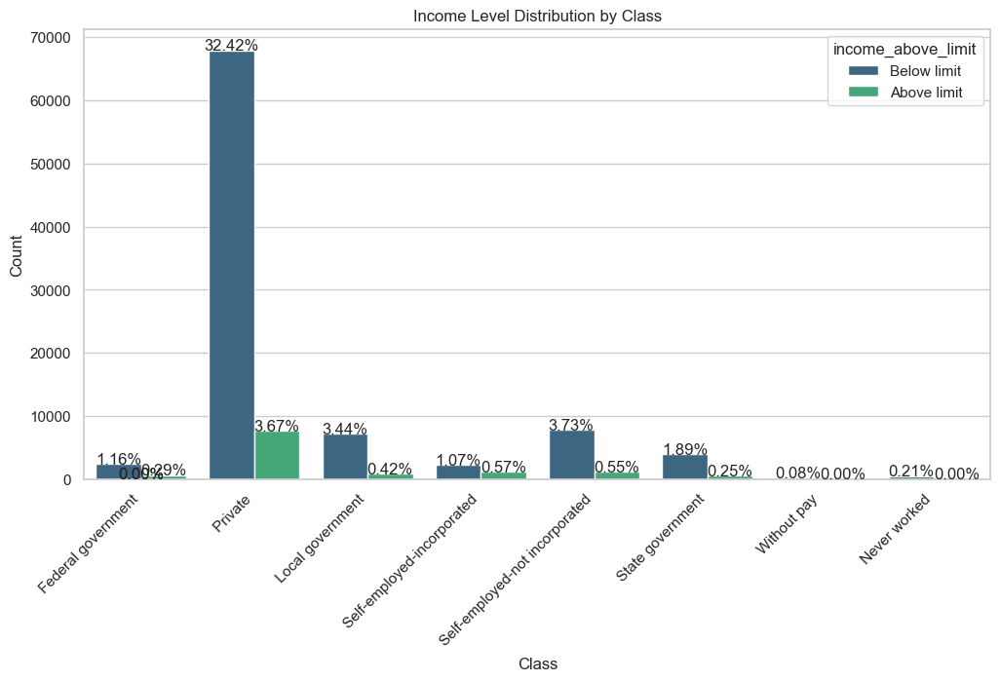

Count Table:
| class                          |   Above limit |   Below limit |   Total |
|:-------------------------------|--------------:|--------------:|--------:|
| Federal government             |           612 |          2435 |    3047 |
| Local government               |           886 |          7207 |    8093 |
| Never worked                   |             2 |           447 |     449 |
| Private                        |          7698 |         67919 |   75617 |
| Self-employed-incorporated     |          1197 |          2247 |    3444 |
| Self-employed-not incorporated |          1145 |          7812 |    8957 |
| State government               |           529 |          3951 |    4480 |
| Without pay                    |             1 |           166 |     167 |
| Total                          |         12070 |         92184 |  104254 |

Percentage Table:
| class                          |   Above limit |   Below limit |      Total |
|:-------------------------------|-------

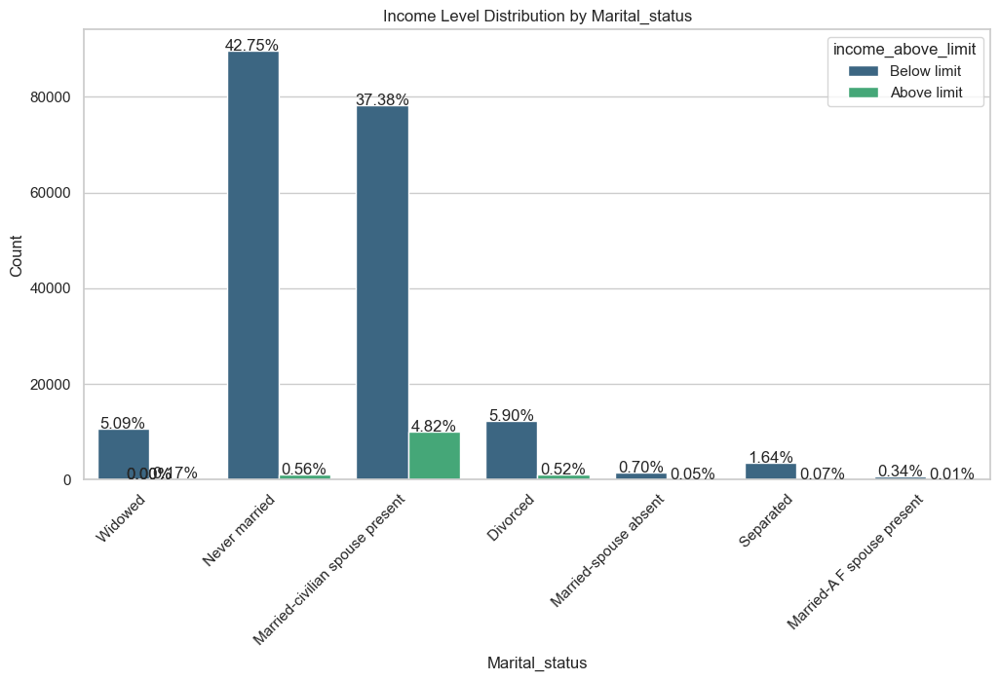

Count Table:
| marital_status                  |   Above limit |   Below limit |   Total |
|:--------------------------------|--------------:|--------------:|--------:|
| Divorced                        |          1095 |         12361 |   13456 |
| Married-A F spouse present      |            13 |           707 |     720 |
| Married-civilian spouse present |         10094 |         78313 |   88407 |
| Married-spouse absent           |           104 |          1464 |    1568 |
| Never married                   |          1170 |         89553 |   90723 |
| Separated                       |           157 |          3439 |    3596 |
| Widowed                         |           365 |         10664 |   11029 |
| Total                           |         12998 |        196501 |  209499 |

Percentage Table:
| marital_status                  |   Above limit |   Below limit |      Total |
|:--------------------------------|--------------:|--------------:|-----------:|
| Divorced                

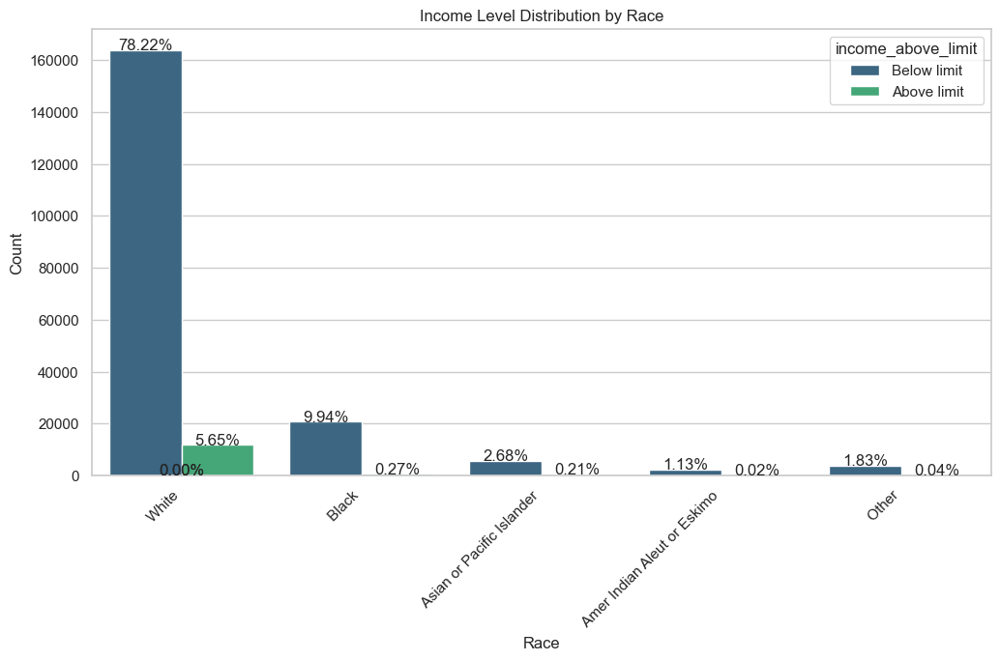

Count Table:
| race                        |   Above limit |   Below limit |   Total |
|:----------------------------|--------------:|--------------:|--------:|
| Amer Indian Aleut or Eskimo |            52 |          2361 |    2413 |
| Asian or Pacific Islander   |           442 |          5614 |    6056 |
| Black                       |           574 |         20820 |   21394 |
| Other                       |            92 |          3835 |    3927 |
| White                       |         11838 |        163871 |  175709 |
| Total                       |         12998 |        196501 |  209499 |

Percentage Table:
| race                        |   Above limit |   Below limit |     Total |
|:----------------------------|--------------:|--------------:|----------:|
| Amer Indian Aleut or Eskimo |      0.400062 |       1.20152 |   1.1518  |
| Asian or Pacific Islander   |      3.40052  |       2.85698 |   2.89071 |
| Black                       |      4.41606  |      10.5954  |  10.212 

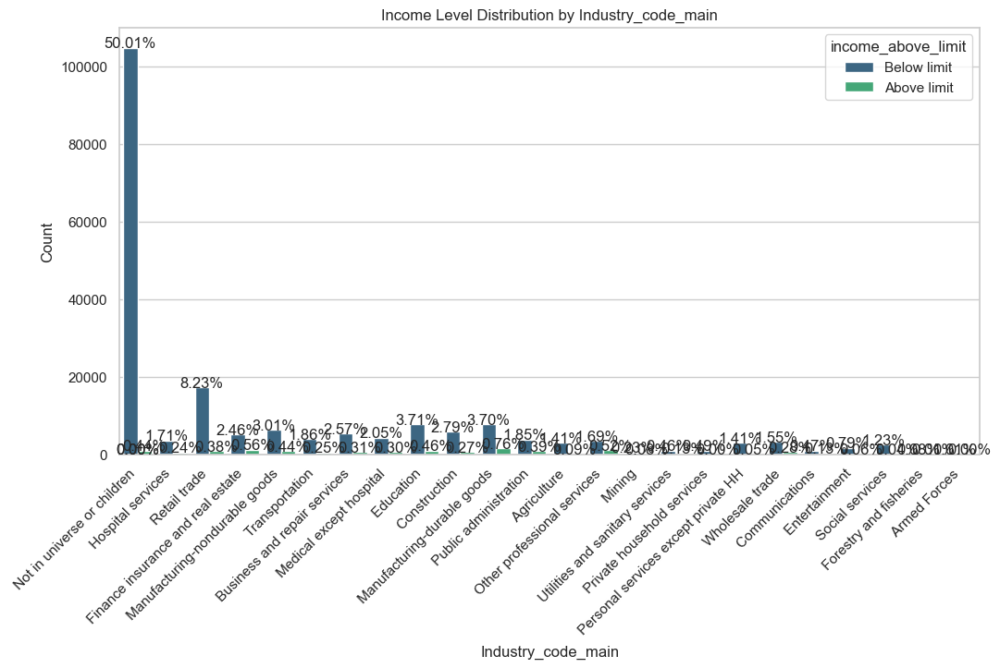

Count Table:
| industry_code_main                  |   Above limit |   Below limit |   Total |
|:------------------------------------|--------------:|--------------:|--------:|
| Agriculture                         |           197 |          2960 |    3157 |
| Armed Forces                        |             8 |            24 |      32 |
| Business and repair services        |           640 |          5381 |    6021 |
| Communications                      |           276 |           984 |    1260 |
| Construction                        |           567 |          5847 |    6414 |
| Education                           |           958 |          7781 |    8739 |
| Entertainment                       |           121 |          1658 |    1779 |
| Finance insurance and real estate   |          1175 |          5161 |    6336 |
| Forestry and fisheries              |            26 |           175 |     201 |
| Hospital services                   |           505 |          3583 |    4088 |
| M

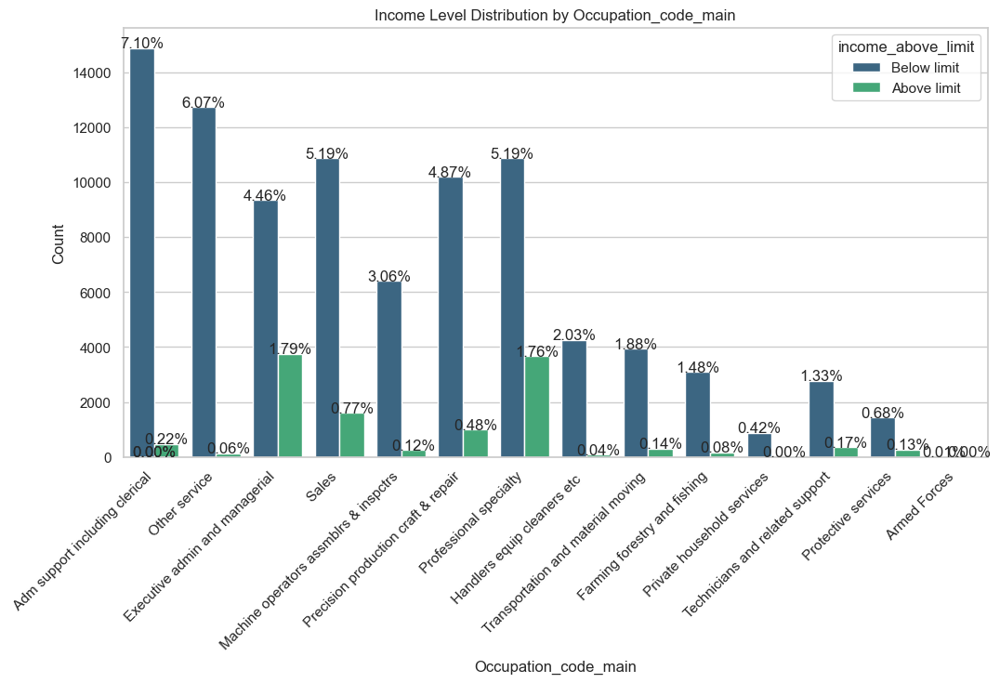

Count Table:
| occupation_code_main                  |   Above limit |   Below limit |   Total |
|:--------------------------------------|--------------:|--------------:|--------:|
| Adm support including clerical        |           469 |         14882 |   15351 |
| Armed Forces                          |             8 |            24 |      32 |
| Executive admin and managerial        |          3753 |          9354 |   13107 |
| Farming forestry and fishing          |           169 |          3104 |    3273 |
| Handlers equip cleaners etc           |            77 |          4263 |    4340 |
| Machine operators assmblrs & inspctrs |           244 |          6406 |    6650 |
| Other service                         |           132 |         12724 |   12856 |
| Precision production craft & repair   |          1008 |         10199 |   11207 |
| Private household services            |             2 |           876 |     878 |
| Professional specialty                |          3677 |      

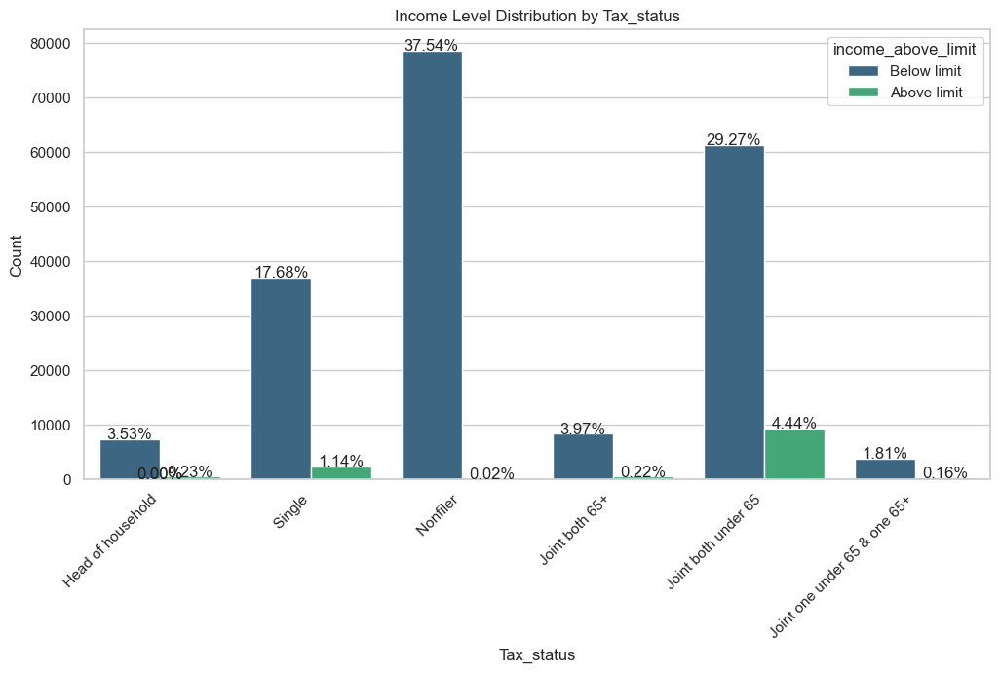

Count Table:
| tax_status                   |   Above limit |   Below limit |   Total |
|:-----------------------------|--------------:|--------------:|--------:|
| Head of household            |           482 |          7400 |    7882 |
| Joint both 65+               |           464 |          8327 |    8791 |
| Joint both under 65          |          9305 |         61312 |   70617 |
| Joint one under 65 & one 65+ |           327 |          3782 |    4109 |
| Nonfiler                     |            33 |         78638 |   78671 |
| Single                       |          2387 |         37042 |   39429 |
| Total                        |         12998 |        196501 |  209499 |

Percentage Table:
| tax_status                   |   Above limit |   Below limit |     Total |
|:-----------------------------|--------------:|--------------:|----------:|
| Head of household            |      3.70826  |       3.76588 |   3.76231 |
| Joint both 65+               |      3.56978  |       4.23764

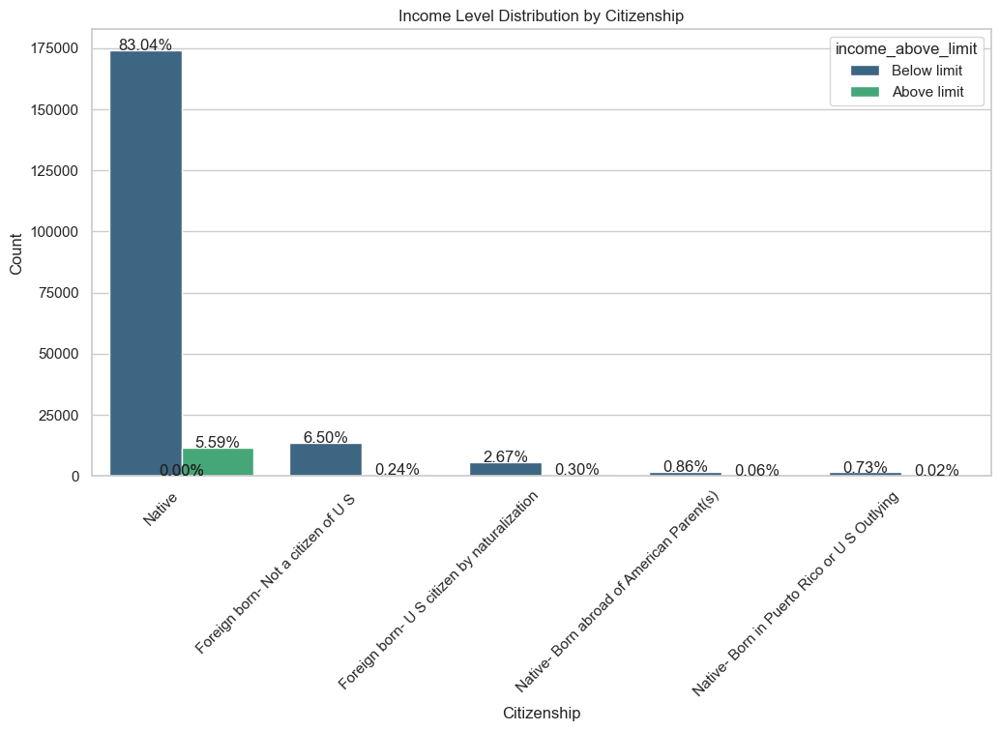

Count Table:
| citizenship                                 |   Above limit |   Below limit |   Total |
|:--------------------------------------------|--------------:|--------------:|--------:|
| Foreign born- Not a citizen of U S          |           511 |         13616 |   14127 |
| Foreign born- U S citizen by naturalization |           619 |          5589 |    6208 |
| Native- Born abroad of American Parent(s)   |           122 |          1802 |    1924 |
| Native- Born in Puerto Rico or U S Outlying |            36 |          1535 |    1571 |
| Native                                      |         11710 |        173959 |  185669 |
| Total                                       |         12998 |        196501 |  209499 |

Percentage Table:
| citizenship                                 |   Above limit |   Below limit |      Total |
|:--------------------------------------------|--------------:|--------------:|-----------:|
| Foreign born- Not a citizen of U S          |      3.93137  

In [34]:
def plot_category_distribution(variable):
    # Set the overall style of the visualization
    sns.set(style="whitegrid")

    # Create the countplot based on the variable
    plt.figure(figsize=(12, 6))
    ax = sns.countplot(x=variable, hue='income_above_limit', data=plot_train, palette='viridis')

    # Set plot title and labels
    plt.title(f'Income Level Distribution by {variable.capitalize()}')
    plt.xlabel(variable.capitalize())
    plt.ylabel('Count')

    # Rotate x-axis labels
    plt.xticks(rotation=45, ha="right")

    # Add percentage labels on top of each bar
    total = float(len(plot_train))  # Total number of records
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2., height + 3, f'{height/total:.2%}', ha="center")

    # Show the plot
    plt.show()

    # Display count and percentage in a table
    count_table = pd.crosstab(plot_train[variable], plot_train['income_above_limit'], margins=True, margins_name='Total')
    percentage_table = (count_table / count_table.loc['Total']) * 100
    print("Count Table:")
    print(count_table.to_markdown())
    print("\nPercentage Table:")
    print(percentage_table.to_markdown())

# List of categorical variables excluding 'age'
categorical_variables_without_age = ['gender', 'education', 'class', 'marital_status', 'race',
                                      'industry_code_main', 'occupation_code_main', 'tax_status', 'citizenship']

# Plot the distribution for each categorical variable
for variable in categorical_variables_without_age:
    plot_category_distribution(variable)


### Hypothesis

In [35]:
def test_categorical_association(df, variable):
    # Create a contingency table
    contingency_table = pd.crosstab(df[variable], df['income_above_limit'])

    # Perform chi-square test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Output the test results
    print(f"Chi-square statistic for {variable}: {chi2}")
    print(f"P-value for {variable}: {p}")

    # Check for significance at a chosen alpha level (e.g., 0.05)
    alpha = 0.05
    if p < alpha:
        print(f"Reject the null hypothesis for {variable}. There is a significant association.")
    else:
        print(f"Fail to reject the null hypothesis for {variable}. There is no significant association.")
    print("\n")

# List of categorical variables excluding 'age'
categorical_variables= ['age','gender', 'education', 'class', 'marital_status', 'race',
                                      'industry_code_main', 'occupation_code_main', 'tax_status', 'citizenship']

# Test the association for each categorical variable
for variable in categorical_variables:
    test_categorical_association(plot_train, variable)


Chi-square statistic for age: 13253.013924918145
P-value for age: 0.0
Reject the null hypothesis for age. There is a significant association.


Chi-square statistic for gender: 5154.827952374376
P-value for gender: 0.0
Reject the null hypothesis for gender. There is a significant association.


Chi-square statistic for education: 32023.58134968222
P-value for education: 0.0
Reject the null hypothesis for education. There is a significant association.


Chi-square statistic for class: 2257.1801198140524
P-value for class: 0.0
Reject the null hypothesis for class. There is a significant association.


Chi-square statistic for marital_status: 8185.082343148208
P-value for marital_status: 0.0
Reject the null hypothesis for marital_status. There is a significant association.


Chi-square statistic for race: 722.6940681167777
P-value for race: 4.2471907565219915e-155
Reject the null hypothesis for race. There is a significant association.


Chi-square statistic for industry_code_main: 16415.

In [36]:
def test_categorical_association(data, variable):
    # Create a contingency table
    contingency_table = pd.crosstab(data[variable], data['income_above_limit'])

    # Perform the chi-square test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Create a DataFrame to store the results
    result_df = pd.DataFrame({
        'Variable': [variable],
        'Chi-Square Statistic': [chi2],
        'P-Value': [p],
    })

    return result_df

# Initialize an empty list to store results
association_results = []

# Test the association for each categorical variable
for variable in categorical_variables:
    result_df = test_categorical_association(train_data, variable)
    association_results.append(result_df)

# Concatenate the list of DataFrames into a single DataFrame
association_results = pd.concat(association_results, ignore_index=True)

# Display the results DataFrame
association_results


,Variable,Chi-Square Statistic,P-Value
0,age,13253.013925,0.000000e+00
1,gender,5154.827952,0.000000e+00
2,education,32023.581350,0.000000e+00
3,class,2257.180120,0.000000e+00
4,marital_status,8185.082343,0.000000e+00
5,race,722.694068,4.247191e-155
6,industry_code_main,16415.136789,0.000000e+00
7,occupation_code_main,10108.231339,0.000000e+00
8,tax_status,11069.285324,0.000000e+00
9,citizenship,358.588487,2.451779e-76


### Data cleaning

In [37]:
# Renaming the column class to working class
train_data.rename(columns={'class': 'work_class'}, inplace=True)

In [38]:

# we drop columns based on knowledge gain and keep the ones below


columns_to_keep = [
    'age', 'gender', 'education', 'work_class', 'marital_status',
    'race', 'is_hispanic', 'employment_commitment', 'wage_per_hour',
    'working_week_per_year', 'industry_code_main', 'occupation_code_main',
    'tax_status', 'citizenship','income_above_limit'
]

# Drop columns that are not in the list 'columns_to_keep'
train_data = train_data[columns_to_keep]


In [39]:
columns_to_print = [
 'age', 'gender', 'education', 'work_class', 'marital_status',
    'race', 'is_hispanic', 'employment_commitment', 'wage_per_hour',
    'working_week_per_year', 'industry_code_main', 'occupation_code_main',
    'tax_status', 'citizenship','income_above_limit'
]

for column in columns_to_print:
    unique_values = train_data[column].unique()
    print(f"{column} unique values: {unique_values}")

    

age unique values: [79 65 21  2 70 45 53 22 73 30  4 16 43 36  5 88 40 47 59 69 50 27 39 85
 29 41 14 33 67 52 11  9 13 19 26 23 37 58 63 46 62 28 31  3 18 78 15 38
  7 35  1 20  0 48 24 56 25  8 66 71 32 75 51 10 44 42 55 74 77 34 80 17
 83 86 12 68 60 57 64 72 90 61 82  6 84 49 76 54 89 81 87]
gender unique values: [' Female' ' Male']
education unique values: [' High school graduate' ' 12th grade no diploma' ' Children'
 ' Bachelors degree(BA AB BS)' ' 7th and 8th grade' ' 11th grade'
 ' 9th grade' ' Masters degree(MA MS MEng MEd MSW MBA)' ' 10th grade'
 ' Associates degree-academic program' ' 1st 2nd 3rd or 4th grade'
 ' Some college but no degree' ' Less than 1st grade'
 ' Associates degree-occup /vocational'
 ' Prof school degree (MD DDS DVM LLB JD)' ' 5th or 6th grade'
 ' Doctorate degree(PhD EdD)']
work_class unique values: [nan ' Federal government' ' Private' ' Local government'
 ' Self-employed-incorporated' ' Self-employed-not incorporated'
 ' State government' ' Without pay

In [40]:
education_mapping = {
    ' High school graduate': 'High School Graduate',
    ' 12th grade no diploma': '12th Grade No Diploma',
    ' Children': 'Children',
    ' Bachelors degree(BA AB BS)': 'Bachelors Degree',
    ' Masters degree(MA MS MEng MEd MSW MBA)': 'Masters Degree',
    ' Associates degree-academic program': 'Associates Degree (Academic Program)',
    ' Associates degree-occup /vocational': 'Associates Degree (Occupational/Vocational)',
    ' Prof school degree (MD DDS DVM LLB JD)': 'Professional School Degree',
    ' Some college but no degree': 'Some College (No Degree)',
    ' Less than 1st grade': 'Less than 1st Grade',
    ' 9th grade': '9th Grade',
    ' 10th grade': '10th Grade',
    ' 11th grade': '11th Grade',
    ' 7th and 8th grade': '7th and 8th Grade',
    ' 5th or 6th grade': '5th or 6th Grade',
    ' Doctorate degree(PhD EdD)':'Doctorate Degree',
    ' 1st 2nd 3rd or 4th grade':' 1st 2nd 3rd or 4th Grade'
}

# Map the education levels
train_data['education'] = train_data['education'].map(education_mapping)


In [41]:
# Convert string values to lowercase for the specified columns
train_data[columns_to_keep] = train_data[columns_to_keep].applymap(lambda x: x.lower() if isinstance(x, str) else x)

/var/folders/p6/66khg_3925z_v93dk63rg8wh0000gn/T/ipykernel_1606/2097402412.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



In [42]:
train_data


,age,gender,education,work_class,marital_status,race,is_hispanic,employment_commitment,wage_per_hour,working_week_per_year,industry_code_main,occupation_code_main,tax_status,citizenship,income_above_limit
0,79,female,high school graduate,NaN,widowed,white,all other,not in labor force,0,52,not in universe or children,NaN,head of household,native,below limit
1,65,female,high school graduate,NaN,widowed,white,all other,children or armed forces,0,0,not in universe or children,NaN,single,native,below limit
2,21,male,12th grade no diploma,federal government,never married,black,all other,children or armed forces,500,15,hospital services,adm support including clerical,single,native,below limit
3,2,female,children,NaN,never married,asian or pacific islander,all other,children or armed forces,0,0,not in universe or children,NaN,nonfiler,native,below limit
4,70,male,high school graduate,NaN,married-civilian spouse present,white,all other,not in labor force,0,0,not in universe or children,NaN,joint both 65+,native,below limit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209494,16,female,7th and 8th grade,NaN,never married,white,all other,not in labor force,0,0,not in universe or children,NaN,nonfiler,native,below limit
209495,78,male,bachelors degree,NaN,married-civilian spouse present,white,all other,not in labor force,0,0,not in universe or children,NaN,joint both 65+,native,below limit
209496,8,female,children,NaN,never married,white,all other,children or armed forces,0,0,not in universe or children,NaN,nonfiler,native,below limit
209497,26,female,some college (no degree),private,married-civilian spouse present,white,all other,children or armed forces,700,52,wholesale trade,handlers equip cleaners etc,joint both under 65,native,below limit


Data Preparation

In [43]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   age                    209499 non-null  int64 
 1   gender                 209499 non-null  object
 2   education              209499 non-null  object
 3   work_class             104254 non-null  object
 4   marital_status         209499 non-null  object
 5   race                   209499 non-null  object
 6   is_hispanic            209499 non-null  object
 7   employment_commitment  209499 non-null  object
 8   wage_per_hour          209499 non-null  int64 
 9   working_week_per_year  209499 non-null  int64 
 10  industry_code_main     209499 non-null  object
 11  occupation_code_main   103805 non-null  object
 12  tax_status             209499 non-null  object
 13  citizenship            209499 non-null  object
 14  income_above_limit     209499 non-null  object
dtype

In [44]:


# Split data into X and y
X = train_data.drop(['income_above_limit'], axis=1)
y = train_data['income_above_limit']  # target variable


X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [45]:
print("X shape:", X.shape)
print("y shape:", y.shape)


X shape: (209499, 14)
y shape: (209499,)


In [46]:
# Print the unique values in the 'income_above_limit' column
print(train_data['income_above_limit'].unique())


['below limit' 'above limit']


In [47]:
# Define numerical and categorical features
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

In [48]:
print(numerical_features)

Index(['age', 'wage_per_hour', 'working_week_per_year'], dtype='object')


In [49]:
print(categorical_features)

Index(['gender', 'education', 'work_class', 'marital_status', 'race',
       'is_hispanic', 'employment_commitment', 'industry_code_main',
       'occupation_code_main', 'tax_status', 'citizenship'],
      dtype='object')


In [50]:
# Define preprocessing steps for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


In [51]:
# Combine transformers for numerical and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])


In [52]:
# encoding the target variable

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


### Class balancing

In [53]:

# Define the resampling strategy

oversampler = RandomOverSampler(random_state=42)

In [54]:
X_train.head()

,age,gender,education,work_class,marital_status,race,is_hispanic,employment_commitment,wage_per_hour,working_week_per_year,industry_code_main,occupation_code_main,tax_status,citizenship
163801,10,male,children,NaN,never married,white,all other,children or armed forces,0,0,not in universe or children,NaN,nonfiler,native
84788,25,female,10th grade,state government,separated,white,all other,pt for non-econ reasons usually ft,0,0,public administration,other service,nonfiler,native
132530,6,female,children,NaN,never married,white,all other,children or armed forces,0,0,not in universe or children,NaN,nonfiler,native
16816,34,male,associates degree (academic program),private,married-civilian spouse present,white,all other,full-time schedules,900,52,finance insurance and real estate,technicians and related support,joint both under 65,native
195177,52,male,high school graduate,private,married-civilian spouse present,white,all other,full-time schedules,1200,52,manufacturing-durable goods,handlers equip cleaners etc,joint both under 65,native


In [55]:
y_train.head()

163801    below limit
84788     below limit
132530    below limit
16816     below limit
195177    below limit
Name: income_above_limit, dtype: object

In [56]:
 #Create a pipeline with preprocessing steps

knnpipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('oversample', oversampler),
    ('kneighbor', KNeighborsClassifier())
    
    ])

# Transform the dataset using the pipeline
knnpipeline.fit(X_train, y_train_encoded)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'wage_per_hour', 'working_week_per_year'], dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['gender', 'education', 'work_class', 'marital_status', 'race',
       'is_hispanic', 'employment_commitment', 'industry_code_main',
       'occupation_code_main', 'tax_status', 'citizenship'],
      dtype='object'))])),
                ('oversample', RandomOverSampler(random_state=42)),
                ('kneighbor', KNeighborsClassifier())])

In [57]:
 #Create a pipeline with preprocessing steps

logpipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('oversample', oversampler),
    ('logisticReg', LogisticRegression())
    
    ])

# Transform the dataset using the pipeline
logpipeline.fit(X_train, y_train_encoded)

/Users/mkboyoo/Desktop/capstoneproject/Capstoneproject/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'wage_per_hour', 'working_week_per_year'], dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['gender', 'education', 'work_class', 'marital_status', 'race',
       'is_hispanic', 'employment_commitment', 'industry_code_main',
       'occupation_code_main', 'tax_status', 'citizenship'],
      dtype='object'))])),
                ('oversample', RandomOverSampler(random_state=42)),
                ('logisticReg', LogisticRegression())])

In [58]:
 #Create a pipeline with preprocessing steps

decision_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('oversample', oversampler),
     ('decision_tree', DecisionTreeClassifier())
    
    ])

# Transform the dataset using the pipeline
decision_pipeline.fit(X_train, y_train_encoded)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'wage_per_hour', 'working_week_per_year'], dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['gender', 'education', 'work_class', 'marital_status', 'race',
       'is_hispanic', 'employment_commitment', 'industry_code_main',
       'occupation_code_main', 'tax_status', 'citizenship'],
      dtype='object'))])),
                ('oversample', RandomOverSampler(random_state=42)),
                ('decision_tree', DecisionTreeClassifier())])

### Evaluation

In [59]:
#predicting the target variable for X_test using Decision tree model
d_tree = decision_pipeline.predict(X_test)

In [60]:
print(classification_report(y_test_encoded,d_tree))

              precision    recall  f1-score   support

           0       0.34      0.43      0.38      3899
           1       0.96      0.95      0.95     58951

    accuracy                           0.91     62850
   macro avg       0.65      0.69      0.67     62850
weighted avg       0.92      0.91      0.92     62850



In [61]:
#predicting the target variable for X_test using K-nearest model
knn_pred = knnpipeline.predict(X_test)

In [62]:
print(classification_report(y_test_encoded,knn_pred))

              precision    recall  f1-score   support

           0       0.32      0.62      0.42      3899
           1       0.97      0.91      0.94     58951

    accuracy                           0.89     62850
   macro avg       0.64      0.76      0.68     62850
weighted avg       0.93      0.89      0.91     62850



In [63]:
#predicting the target variable for X_test using Logistic regression model
logreg_pred = logpipeline .predict(X_test)

In [64]:
print(classification_report(y_test_encoded,logreg_pred))

              precision    recall  f1-score   support

           0       0.25      0.88      0.39      3899
           1       0.99      0.83      0.90     58951

    accuracy                           0.83     62850
   macro avg       0.62      0.85      0.65     62850
weighted avg       0.94      0.83      0.87     62850



# Saving the Pipeline and Encoder

In [65]:


# Specify the paths
project_path = os.getcwd()
dev_path = os.path.join(project_path, 'dev')

# Save the joblib files in the 'capstone-pro/dev' directory
joblib.dump(decision_pipeline, os.path.join(dev_path, 'dtree_pipeline.joblib'))
joblib.dump(label_encoder, os.path.join(dev_path, 'labelencoderbal.joblib'))


['/Users/mkboyoo/Desktop/capstoneproject/Capstoneproject/dev/labelencoderbal.joblib']

# Test data evaluation

In [66]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89786 entries, 0 to 89785
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ID                              89786 non-null  object 
 1   age                             89786 non-null  int64  
 2   gender                          89786 non-null  object 
 3   education                       89786 non-null  object 
 4   class                           44707 non-null  object 
 5   education_institute             5616 non-null   object 
 6   marital_status                  89786 non-null  object 
 7   race                            89786 non-null  object 
 8   is_hispanic                     89786 non-null  object 
 9   employment_commitment           89786 non-null  object 
 10  unemployment_reason             2680 non-null   object 
 11  employment_stat                 89786 non-null  int64  
 12  wage_per_hour                   

In [67]:
# Checking the percentage of ull values
null_percentage = test_data.isnull().mean() * 100

# Displaying the result
print(null_percentage)






ID                                 0.000000
age                                0.000000
gender                             0.000000
education                          0.000000
class                             50.207159
education_institute               93.745127
marital_status                     0.000000
race                               0.000000
is_hispanic                        0.000000
employment_commitment              0.000000
unemployment_reason               97.015125
employment_stat                    0.000000
wage_per_hour                      0.000000
is_labor_union                    90.573141
working_week_per_year              0.000000
industry_code                      0.000000
industry_code_main                 0.000000
occupation_code                    0.000000
occupation_code_main              50.423229
total_employed                     0.000000
household_stat                     0.000000
household_summary                  0.000000
under_18_family                 

In [68]:
# Sort the null percentages in descending order
sorted_null_percentage = null_percentage.sort_values(ascending=False)

# Display the sorted result
print(sorted_null_percentage)

veterans_admin_questionnaire      98.967545
unemployment_reason               97.015125
education_institute               93.745127
old_residence_state               92.074488
old_residence_reg                 92.074488
is_labor_union                    90.573141
under_18_family                   72.363175
residence_1_year_ago              50.784087
occupation_code_main              50.423229
class                             50.207159
migration_prev_sunbelt            42.015459
migration_code_move_within_reg     0.725057
migration_code_change_in_msa       0.725057
migration_code_change_in_reg       0.725057
gains                              0.000000
losses                             0.000000
stocks_status                      0.000000
ID                                 0.000000
citizenship                        0.000000
mig_year                           0.000000
country_of_birth_own               0.000000
country_of_birth_father            0.000000
tax_status                      

In [69]:

# we drop all columns with over 70% null valies

# List of columns to be dropped
columns_to_drop = [
    'veterans_admin_questionnaire',
    'unemployment_reason',
    'education_institute',
    'old_residence_state',
    'old_residence_reg',
    'is_labor_union',
    'under_18_family'
]

# Drop the specified columns
test_data = test_data.drop(columns=columns_to_drop)


In [70]:
# Renaming the column class to working class
test_data.rename(columns={'class': 'work_class'}, inplace=True)

In [71]:

# we drop columns based on knowledge gain and keep the ones below


columns_to_keep = [
    'age', 'gender', 'education', 'work_class', 'marital_status',
    'race', 'is_hispanic', 'employment_commitment', 'wage_per_hour',
    'working_week_per_year', 'industry_code_main', 'occupation_code_main',
    'tax_status', 'citizenship'
]

# Drop columns that are not in the list 'columns_to_keep'
test_data = test_data[columns_to_keep]


In [72]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89786 entries, 0 to 89785
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   age                    89786 non-null  int64 
 1   gender                 89786 non-null  object
 2   education              89786 non-null  object
 3   work_class             44707 non-null  object
 4   marital_status         89786 non-null  object
 5   race                   89786 non-null  object
 6   is_hispanic            89786 non-null  object
 7   employment_commitment  89786 non-null  object
 8   wage_per_hour          89786 non-null  int64 
 9   working_week_per_year  89786 non-null  int64 
 10  industry_code_main     89786 non-null  object
 11  occupation_code_main   44513 non-null  object
 12  tax_status             89786 non-null  object
 13  citizenship            89786 non-null  object
dtypes: int64(3), object(11)
memory usage: 9.6+ MB


In [73]:
# Define columns with missing values
columns_with_missing_values = ['occupation_code_main', 'work_class']

# Create a SimpleImputer instance for categorical columns (assuming these columns are categorical)
categorical_imputer = SimpleImputer(strategy='most_frequent')

new_test = test_data.copy()

# Impute missing values for categorical columns
new_test[columns_with_missing_values] = categorical_imputer.fit_transform(new_test[columns_with_missing_values])

In [74]:
new_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89786 entries, 0 to 89785
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   age                    89786 non-null  int64 
 1   gender                 89786 non-null  object
 2   education              89786 non-null  object
 3   work_class             89786 non-null  object
 4   marital_status         89786 non-null  object
 5   race                   89786 non-null  object
 6   is_hispanic            89786 non-null  object
 7   employment_commitment  89786 non-null  object
 8   wage_per_hour          89786 non-null  int64 
 9   working_week_per_year  89786 non-null  int64 
 10  industry_code_main     89786 non-null  object
 11  occupation_code_main   89786 non-null  object
 12  tax_status             89786 non-null  object
 13  citizenship            89786 non-null  object
dtypes: int64(3), object(11)
memory usage: 9.6+ MB


In [75]:
d_tree = decision_pipeline.predict(new_test)

In [76]:
new_sample_sub =samplesub.copy()
new_sample_sub["income_above_limit"] = d_tree

In [77]:
new_sample_sub.head()

,ID,income_above_limit
0,ID_TZ209499,1
1,ID_TZ209500,1
2,ID_TZ209501,1
3,ID_TZ209502,1
4,ID_TZ209503,1
